### Imports

In [2]:
from pprint import pprint

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import arviz as az
import pdb
import time

import tensorflow.compat.v2 as tf
import tensorflow_probability as tfp

from random import randint

tf.enable_v2_behavior()

tfd = tfp.distributions
tfb = tfp.bijectors

dtype = tf.float64

sns.reset_defaults()
#sns.set_style('whitegrid')
#sns.set_context('talk')
sns.set_context(context='talk', font_scale=0.7)

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [3]:
def trace_plot_param(param_chains, param_names, true_values=None):
    
    colors = []
    num_chains = param_chains.shape[1]
    chain_length = param_chains.shape[0]
    
    if len(param_chains.shape) == 2:
        num_params = 1
    elif len(param_chains.shape) == 3:
        num_params = param_chains.shape[2]
        
    for i in range(num_params):
        colors.append('#%06X' % randint(0, 0xFFFFFF))

    fig, axes = plt.subplots(num_params, num_chains, figsize=(25, 3 * num_params))
    
    if num_params > 1:
        for chain_idx in range(num_chains):
            for param_idx in range(num_params):

                ax = axes[param_idx, chain_idx]
                chain = param_chains[:,chain_idx, param_idx]

                
                ax.plot(chain, c=colors[param_idx], alpha=.3, label=f"{param_names}_{param_idx}")
                if not true_values is None:
                    true_value = true_values[param_idx]
                    ax.hlines(true_value, 0, chain_length, zorder=4, color=colors[param_idx])
                ax.legend(loc='upper right')
    else:
        for chain_idx in range(num_chains):
            #pdb.set_trace()
            ax = axes[chain_idx]
            chain = param_chains[:,chain_idx]
            

            ax.plot(chain, c=colors[0], alpha=.3, label=f"{param_names}")
            if not true_values is None:
                true_value = true_values
                ax.hlines(true_value, 0, chain_length, zorder=4, color=colors[0])
            ax.legend(loc='upper right')
            #plt.tight_layout()
            #plt.show()
    return fig

def trace_plot(chains, param_names, true_values=None):
    for i in range(len(chains)):
        chain = chains[i]
        
        if true_values is None:
            true_value = None
        else:
            true_value = true_values[i]
    
        param_name = param_names[i]
        trace_plot_param(chain, param_name, true_value)
        plt.tight_layout()
        plt.show()


In [4]:
def density_plot_param(param_chains, param_names, true_values):
    
    colors = []
    num_chains = param_chains.shape[1]
    chain_length = param_chains.shape[0]
    
    if len(param_chains.shape) == 2:
        num_params = 1
    elif len(param_chains.shape) == 3:
        num_params = param_chains.shape[2]
        
    for i in range(num_params):
        colors.append('#%06X' % randint(0, 0xFFFFFF))

    fig, axes = plt.subplots(num_params, num_chains, figsize=(25, 3 * num_params))
    
    if num_params > 1:
        for chain_idx in range(num_chains):
            for param_idx in range(num_params):

                ax = axes[param_idx, chain_idx]
                chain = param_chains[:,chain_idx, param_idx]
                
                
                sns.distplot(chain, color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3}, label=f"{param_names}_{param_idx}")
                ymax = ax.get_ylim()[1]
                if not true_values is None:
                    true_value = true_values[param_idx]
                    ax.vlines(true_value, 0, ymax, color=colors[i], linewidth=3)
                ax.set_ylim(0, ymax)
                ax.legend(loc='upper right')  

    else:
        for chain_idx in range(num_chains):
            #pdb.set_trace()
            ax = axes[chain_idx]
            chain = param_chains[:,chain_idx]

            sns.distplot(chain, color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3}, label=f"{param_names}")
            ymax = ax.get_ylim()[1]
            if not true_values is None:
                true_value = true_values
                ax.vlines(true_value, 0, ymax, color=colors[i], linewidth=3)
            ax.set_ylim(0, ymax)
            ax.legend(loc='upper right')  

    return fig

def density_plot(chains, param_names, true_values=None):
    for i in range(len(chains)):
        chain = chains[i]
        
        if true_values is None:
            true_value = None
        else:
            true_value = true_values[i]
        
        param_name = param_names[i]
        density_plot_param(chain, param_name, true_value)
        plt.tight_layout()
        plt.show()


In [ ]:
np.random.seed(25)
n_changepoints = 10
t = np.arange(1000)
s = np.sort(np.random.choice(t, n_changepoints, replace=False)) # sample change points

A = (t[:, None] > s) * 1

In [ ]:
np.random.seed(25)
n_changepoints = 10
t = np.arange(1000)
s = np.sort(np.random.choice(t, n_changepoints, replace=False)) # sample change points

A = (t[:, None] > s) * 1  # broadcast for each change point
delta = np.random.normal(size=n_changepoints) # sample change 
k = 1
m = 5

growth = (k + A @ delta) * t  # 
gamma = -s * delta
offset = m + A @ gamma
trend = growth + offset

plt.figure(figsize=(16, 3 * 3))
n = 310
i = 0
for t, f in zip(['Linear Trend with Changepoints', 'Growth rate', 'Growth offset'],
                [trend, growth, offset]):
    i += 1
    plt.subplot(n + i)
    plt.title(t)
    plt.yticks([])
    plt.vlines(s, min(f), max(f), lw=0.8, linestyles='--')
    plt.plot(f)


In [ ]:
df = pd.read_csv('data/peyton_manning.csv')
# Make sure we work with datetime types
df['ds'] = pd.to_datetime(df['ds'])
# Scale the data
df['y_scaled'] = df['y'] / df['y'].max()
df['t'] = (df['ds'] - df['ds'].min()) / (df['ds'].max() - df['ds'].min())
df.plot(x='ds', y='y', figsize=(16, 6), title="Wikipedia pageviews for 'Peyton Manning'")

### Build Model Class

In [ ]:
def trend(k, delta, s, t, m, A):
    #pdb.set_trace()
    # if batch shape is empty, delta has shape (n_changepoints, ) else (n_samples, n_changepoints)  
    gamma =  tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    if len(gamma.shape) < 2:
        g = (k + tf.linalg.matmul(delta[tf.newaxis, ...], A, adjoint_b=True)) * t + (m +tf.linalg.matmul(gamma[tf.newaxis, ...], A, adjoint_b=True))
    else :
        g = (k[..., tf.newaxis] + tf.linalg.matmul(delta, A, adjoint_b=True)) * t + (m[..., tf.newaxis] +tf.linalg.matmul(gamma, A, adjoint_b=True))
    return tf.squeeze(g)

class trend_model():
    """
    Parameters
        t: time points of observations
        n_changepoints: number of changepoints
        changepoint_range: range in which changepoints are allowed
    """
    
    def __init__(self, t, m=0, n_changepoints=5, changepoint_range = 0.8):
        
        s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
        A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)
        
        self._joint = joint = tfd.JointDistributionSequential([
            tfd.Normal(loc=0., scale=1.), # k
            tfd.Normal(loc=10., scale=1.), # m 
            tfd.Exponential(rate=20), # tau
            lambda tau: tfd.Sample(
                tfd.Laplace(loc=0., scale=tau), 
                n_changepoints
            ), # delta
            tfd.HalfCauchy(loc=0., scale=.5), # sigma
            lambda sigma, delta, tau, m, k: tfd.MultivariateNormalDiag(
                loc=trend(k, delta, s, t, m, A),
                scale_identity_multiplier=sigma), # y
        ])
    
    def sample(self, n_samples=None):
        if n_samples is None:
            return self._joint.sample()
        else:
            return self._joint.sample(n_samples)
       
    def joint_log_prob(self, k, m, tau, delta, sigma, y):
        return self._joint.log_prob(k, m, tau, delta, sigma, y)
    
    def forecast():
        pass
    

In [ ]:
t = np.arange(11)
n_changepoints = 3
changepoint_range = 0.8
m = 10
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)

model=trend_model(t=t, n_changepoints=n_changepoints)


In [ ]:
n_sampels = 2
model.sample()

In [ ]:
model._joint.log_prob_parts(model._joint.sample())

In [ ]:
model._joint.log_prob(model._joint.sample())

In [ ]:
n_samples = 3
k, m,  tau, delta, sigma, y = model.sample(n_samples)
print(k, k[..., tf.newaxis]+delta)
fig, axes = plt.subplots(1, n_samples, figsize=(5*n_samples, 5))
for i in range(n_samples):
    axes[i].plot(y[i,:])
    axes[i].vlines(s, min(y[i,:]), max(y[i,:]), lw=0.8, linestyles='--')
plt.tight_layout()

### Bayesian Inference

#### Random Walk Metropolis Hastings

In [ ]:
t = np.arange(100)
n_changepoints = 3
changepoint_range = 0.8
# m = 10
# s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
# A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)

model = trend_model(t=t, n_changepoints=n_changepoints)
k, m,  tau, delta, sigma, ys = model.sample()
plt.plot(ys)

In [ ]:
def unnormalized_posterior(k, m, tau, delta, sigma):
    return model.joint_log_prob(k, m, tau, delta, sigma, ys)

In [ ]:
unnormalized_posterior(k, m, tau, delta, sigma)

In [ ]:
num_chains = 4
initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                 ys[0] * np.ones(num_chains, dtype=np.float32), # m
                 np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 np.ones(num_chains, dtype=np.float32) # sigma
                ]

In [ ]:
rw_kernel = tfp.mcmc.RandomWalkMetropolis(
    target_log_prob_fn=unnormalized_posterior,
    new_state_fn=tfp.mcmc.random_walk_normal_fn(scale=0.1, name=None)
)

In [ ]:
rw_kernel.bootstrap_results(initial_state)

In [ ]:
@tf.function
def run_chain(initial_state, num_results=2000, num_burnin=1000):
    chains, kernel_results = tfp.mcmc.sample_chain(
        kernel=rw_kernel,
        num_results=num_results, 
        current_state=initial_state,
        num_burnin_steps=num_burnin,
        trace_fn=lambda cs, kr: kr
    )
    return chains, kernel_results 

In [ ]:
num_results = 100
num_burnin = 50

chains, kernel_results  = run_chain(initial_state=initial_state, num_results=num_results, num_burnin=num_burnin)
print("Acceptance rate:", kernel_results.is_accepted.numpy().mean())

In [ ]:
k_chains, m_chains, tau_chains, delta_chains, sigma_chains = chains

In [ ]:
colors = []
for i in range(8):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(7, num_chains, figsize=(4 * num_chains, 20))
for j in range(num_chains):
    # delta
    for i in range(3):
        ax = axes[i][j]
        ax.plot(delta_chains[:, j, i], c=colors[i], alpha=.3)
        ax.hlines(delta[i], 0, num_results, zorder=4, color=colors[i], label="$delta_{}$".format(i))
        ax.legend(loc='upper right')
    # k
    ax = axes[3][j]
    ax.plot(k_chains[:, j], alpha=.3, c=colors[3])
    ax.hlines(k, 0, num_results, zorder=4, color=colors[3], label="k".format(i))
    ax.legend(loc='upper right')
    
    # m
    ax = axes[4][j]
    ax.plot(m_chains[:, j], alpha=.3, c=colors[3])
    ax.hlines(m, 0, num_results, zorder=4, color=colors[3], label="m")
    ax.legend(loc='upper right')
    
    # tau
    ax = axes[5][j]
    ax.plot(tau_chains[:, j], alpha=.3, c=colors[3])
    ax.hlines(tau, 0, num_results, zorder=4, color=colors[3], label="$\tau$")
    ax.legend(loc='upper right')
    
    # sigma
    ax = axes[6][j]
    ax.plot(sigma_chains[:, j], alpha=.3, c=colors[3])
    ax.hlines(sigma, 0, num_results, zorder=4, color=colors[3], label="$\sigma$")
    ax.legend(loc='upper right')
    
fig.tight_layout()
plt.show()

### Hamiltonian Monte Carlo

In [ ]:
t = np.arange(200)
n_changepoints = 5
changepoint_range = 0.8
# m = 10
# s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
# A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)

model = trend_model(t=t, n_changepoints=n_changepoints)
k, m,  tau, delta, sigma, ys = model.sample()
plt.plot(ys)

In [ ]:
def trace_fn(_, pkr):
      return (
          pkr.inner_results.log_accept_ratio,
          pkr.inner_results.accepted_results.target_log_prob,
          pkr.inner_results.accepted_results.step_size)


# Create an HMC TransitionKernel
inner_kernel = tfp.mcmc.HamiltonianMonteCarlo(
    target_log_prob_fn=unnormalized_posterior,
    step_size=np.float64(.01),
    num_leapfrog_steps=8)

transformed_kernel = tfp.mcmc.TransformedTransitionKernel(
    inner_kernel=inner_kernel,
    bijector=[
        tfp.bijectors.Identity(),    # k
        tfp.bijectors.Identity(),    # m
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # tau
        tfp.bijectors.Identity(), # delta
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # sigma
    ]
) 

kernel = tfp.mcmc.SimpleStepSizeAdaptation(
    inner_kernel = transformed_kernel,
    num_adaptation_steps=400,
    target_accept_prob=0.6,
    adaptation_rate=0.01
)

@tf.function
def run_chain_hmc(initial_state, num_results=10000, num_burnin_steps=2500):

    #chains, (log_accept_ratio, target_log_prob, step_size) = tfp.mcmc.sample_chain(
    chains, kr = tfp.mcmc.sample_chain(
        kernel=kernel,
        num_results=num_results,
        num_burnin_steps=num_burnin_steps,
        current_state=initial_state,
        
        # trace_fn=trace_fn
    ) 
    #return chains, log_accept_ratio, target_log_prob, step_size
    return chains, kr

In [ ]:
plt.plot(ys)

In [ ]:
num_results = 100
num_burnin = 50
num_chains = 8
initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                  ys[0] * np.ones(num_chains, dtype=np.float32), # m * np.ones(num_chains, dtype=np.float32), # m
                 0.02 * np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 0.5 * np.ones(num_chains, dtype=np.float32) # sigma
                ]

# chains, log_accept_ratio, target_log_prob, step_size = run_chain_hmc(initial_state, num_results, num_burnin)
chains, kr = run_chain_hmc(initial_state, num_results, num_burnin)

In [ ]:
r_hat = tfp.mcmc.potential_scale_reduction(chains)
print("Acceptance rate:", kr.inner_results.inner_results.is_accepted.numpy().mean())
print("R-hat diagnostic (k):", r_hat[0].numpy())
print("R-hat diagnostic (m):", r_hat[1].numpy())
print("R-hat diagnostic (tau):", r_hat[2].numpy())
print("R-hat diagnostic (delta):", r_hat[3].numpy())
print("R-hat diagnostic (sigma):", r_hat[4].numpy())

In [ ]:
k_chains, m_chains, tau_chains, delta_chains, sigma_chains = chains

In [ ]:
colors = []
for i in range(8):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(7, num_chains, figsize=(2 * num_chains, 20))
for j in range(num_chains):
    # delta
    for i in range(3):
        ax = axes[i][j]
        ax.plot(delta_chains[:, j, i], c=colors[i], alpha=.3)
        ax.hlines(delta[i], 0, num_results, zorder=4, color=colors[i], label="$\delta_{}$".format(i))
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    ax.plot(k_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(k, 0, num_results, zorder=4, color=colors[i], label="k".format(i))
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    ax.plot(m_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(m, 0, num_results, zorder=4, color=colors[i], label="m")
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    ax.plot(tau_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(tau, 0, num_results, zorder=4, color=colors[i], label="$\tau$")
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    ax.plot(sigma_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(sigma, 0, num_results, zorder=4, color=colors[i], label="$\sigma$")
    ax.legend(loc='upper right')
    
fig.tight_layout()
plt.show()

In [ ]:
colors = []
for i in range(8):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(7, num_chains, figsize=(2 * num_chains, 20))
for j in range(num_chains):
    
    # delta
    for i in range(3):
        ax = axes[i][j]
        sns.distplot(delta_chains[:, j, i], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    for i in range(3):
        ax = axes[i][j]
        ymax = ax.get_ylim()[1]
        ax.vlines(delta[i], 0, ymax, color=colors[i], label="$\delta_{}$".format(i), linewidth=3)
        ax.set_ylim(0, ymax)
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    sns.distplot(k_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(k, 0, ymax, color=colors[i], label="k", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    sns.distplot(m_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(m, 0, ymax, color=colors[i], label="m", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    sns.distplot(tau_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(tau, 0, ymax, color=colors[i], label="tau", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    sns.distplot(sigma_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(sigma, 0, ymax, color=colors[i], label="$\sigma$", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
fig.tight_layout()
plt.show()

### No-U-Turn-Sampler

In [ ]:
t = np.arange(200)
n_changepoints = 5
changepoint_range = 0.8
# m = 10
# s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
# A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)

model = trend_model(t=t, n_changepoints=n_changepoints)
k, m,  tau, delta, sigma, ys = model.sample()
plt.plot(ys)

In [ ]:
def unnormalized_posterior(k, m, tau, delta, sigma):
    return model.joint_log_prob(k, m, tau, delta, sigma, ys)

In [ ]:
def trace_fn(_, pkr):
      return (
          pkr.inner_results.log_accept_ratio,
          pkr.inner_results.accepted_results.target_log_prob,
          pkr.inner_results.accepted_results.step_size)

nuts_kernel = tfp.mcmc.NoUTurnSampler(
    target_log_prob_fn=unnormalized_posterior,
    step_size=np.float64(.01),
    max_tree_depth=10,
    max_energy_diff=1000.0,
    unrolled_leapfrog_steps=4,
    parallel_iterations=10,
    seed=None,
    name=None
)

trans_nuts = tfp.mcmc.TransformedTransitionKernel(
    inner_kernel=nuts_kernel,
    bijector=[
        tfp.bijectors.Identity(),    # k
        tfp.bijectors.Identity(),    # m
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # tau    # sample from real numbers and transforme to the positive real numbers (support of Exp-Distribution)
        tfp.bijectors.Identity(), # delta
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # sigma  # sample from real numbers and transforme to the positive real numbers (support of Half-Cauchy-Distribution)
    ]
) 

adaptive_trans_nuts = tfp.mcmc.DualAveragingStepSizeAdaptation(
    inner_kernel=trans_nuts,
    num_adaptation_steps=2000,
    target_accept_prob=0.55,
    step_size_setter_fn=lambda pkr, new_step_size: pkr._replace(
        inner_results=pkr.inner_results._replace(step_size=new_step_size)
        ),
    step_size_getter_fn=lambda pkr: pkr.inner_results.step_size,
    log_accept_prob_getter_fn=lambda pkr: pkr.inner_results.log_accept_ratio,
)



@tf.function(autograph=False, experimental_compile=True)
def run_chain_hmc(initial_state, num_results=10000, num_burnin_steps=2500):

    chains, kr = tfp.mcmc.sample_chain(
        kernel=adaptive_trans_nuts,
        num_results=num_results,
        num_burnin_steps=num_burnin_steps,
        current_state=initial_state,
        
        # trace_fn=trace_fn
    ) 
    #return chains, log_accept_ratio, target_log_prob, step_size
    return chains, kr

In [ ]:
num_results = 5000
num_burnin = 2500
num_chains = 8
initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                  ys[0] * np.ones(num_chains, dtype=np.float32), # m * np.ones(num_chains, dtype=np.float32), # m
                 np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 np.ones(num_chains, dtype=np.float32) # sigma
                ]

# chains, log_accept_ratio, target_log_prob, step_size = run_chain_hmc(initial_state, num_results, num_burnin)
start = time.time()
chains, kr = run_chain_hmc(initial_state, num_results, num_burnin)
end = time.time()
print(end - start)

In [ ]:
r_hat = tfp.mcmc.potential_scale_reduction(chains)
print("Acceptance rate:", kr.inner_results.inner_results.is_accepted.numpy().mean())
print("R-hat diagnostic (k):", r_hat[0].numpy())
print("R-hat diagnostic (m):", r_hat[1].numpy())
print("R-hat diagnostic (tau):", r_hat[2].numpy())
print("R-hat diagnostic (delta):", r_hat[3].numpy())
print("R-hat diagnostic (sigma):", r_hat[4].numpy())

In [ ]:
k_chains, m_chains, tau_chains, delta_chains, sigma_chains = chains

In [ ]:
colors = []
for i in range(8):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(7, num_chains, figsize=(2 * num_chains, 20))
for j in range(num_chains):
    # delta
    for i in range(3):
        ax = axes[i][j]
        ax.plot(delta_chains[:, j, i], c=colors[i], alpha=.3)
        ax.hlines(delta[i], 0, num_results, zorder=4, color=colors[i], label="$\delta_{}$".format(i))
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    ax.plot(k_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(k, 0, num_results, zorder=4, color=colors[i], label="k".format(i))
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    ax.plot(m_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(m, 0, num_results, zorder=4, color=colors[i], label="m")
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    ax.plot(tau_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(tau, 0, num_results, zorder=4, color=colors[i], label="$\tau$")
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    ax.plot(sigma_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(sigma, 0, num_results, zorder=4, color=colors[i], label="$\sigma$")
    ax.legend(loc='upper right')
    
fig.tight_layout()
plt.show()

In [ ]:
colors = []
for i in range(8):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(7, num_chains, figsize=(2 * num_chains, 20))
for j in range(num_chains):
    
    # delta
    for i in range(3):
        ax = axes[i][j]
        sns.distplot(delta_chains[:, j, i], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    for i in range(3):
        ax = axes[i][j]
        ymax = ax.get_ylim()[1]
        ax.vlines(delta[i], 0, ymax, color=colors[i], label="$\delta_{}$".format(i), linewidth=3)
        ax.set_ylim(0, ymax)
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    sns.distplot(k_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(k, 0, ymax, color=colors[i], label="k", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    sns.distplot(m_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(m, 0, ymax, color=colors[i], label="m", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    sns.distplot(tau_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(tau, 0, ymax, color=colors[i], label="tau", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    sns.distplot(sigma_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(sigma, 0, ymax, color=colors[i], label="$\sigma$", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
fig.tight_layout()
plt.show()

#### Variational Inference

## Minimum Working Example

In [ ]:
def fourier_series(t, p=7, n=3):
    # 2 pi n / p
    x = 2 * np.pi * np.arange(1, n + 1) / p
    # 2 pi n / p * t
    x = x * t[:, None]
    x = np.concatenate((np.cos(x), np.sin(x)), axis=1)
    return x

n = 1
t = np.arange(1000)
beta = np.random.normal(size=2 * n)
plt.figure(figsize=(16, 6))
plt.plot(fourier_series(t, 365.25, n) @ beta)

In [ ]:
def trend(k, delta, s, t, m, A):
    gamma = tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    return tf.linalg.matmul(delta[tf.newaxis, ...], tf.transpose(A)) * t + (m + tf.linalg.matmul(gamma[tf.newaxis, ...], tf.transpose(A)))

def mu(k, delta, s, t, m, A, p, n_weekly, n_yearly, beta_weekly, beta_yearly):
    mu1 = trend(k, delta, s, t, m, A)+fourier(t, p=7, n=n_weekly, beta=beta_weekly)+fourier(t, p=365.25, n=n_yearly, beta=beta_yearly)
    return mu1[0, ]

In [ ]:
def trend(k, delta, s, t, m, A):
    #pdb.set_trace()
    # if batch shape is empty, delta has shape (n_changepoints, ) else (n_samples, n_changepoints)  
    gamma =  tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    if len(gamma.shape) < 2:
        g = (k + tf.linalg.matmul(delta[tf.newaxis, ...], A, adjoint_b=True)) * t + (m +tf.linalg.matmul(gamma[tf.newaxis, ...], A, adjoint_b=True))
    else :
        g = (k[..., tf.newaxis] + tf.linalg.matmul(delta, A, adjoint_b=True)) * t + (m[..., tf.newaxis] +tf.linalg.matmul(gamma, A, adjoint_b=True))
    return tf.squeeze(g)

def fourier(t, p, n, beta):
    
    fourier = tf.convert_to_tensor(fourier_series(t, p=p, n=n), dtype=tf.float32)
    if len(beta.shape) < 2:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta[tf.newaxis, ...], fourier, adjoint_b=True)
    else:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta, fourier, adjoint_b=True)
        
    return tf.squeeze(seasonal)

In [ ]:
def trend(k, delta, s, t, m, A):
    #pdb.set_trace()
    # if batch shape is empty, delta has shape (n_changepoints, ) else (n_samples, n_changepoints)  
    gamma =  tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    if len(gamma.shape) < 2:
        g = (k + tf.linalg.matmul(delta[tf.newaxis, ...], A, adjoint_b=True)) * t + (m +tf.linalg.matmul(gamma[tf.newaxis, ...], A, adjoint_b=True))
    else :
        g = (k[..., tf.newaxis] + tf.linalg.matmul(delta, A, adjoint_b=True)) * t + (m[..., tf.newaxis] +tf.linalg.matmul(gamma, A, adjoint_b=True))
    return tf.squeeze(g)

def fourier(t, p, n, beta):
    
    fourier = tf.convert_to_tensor(fourier_series(t, p=p, n=n), dtype=tf.float32)
    if len(beta.shape) < 2:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta[tf.newaxis, ...], fourier, adjoint_b=True)
    else:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta, fourier, adjoint_b=True)
        
    return tf.squeeze(seasonal)

class seasonal_model():
    """
    Parameters
        t: time points of observations
        n_changepoints: number of changepoints
        changepoint_range: range in which changepoints are allowed
    """
    
    def __init__(self, t, n, p, n_changepoints=None, changepoint_range = 0.8):
        
        if n_changepoints is None:
            n_changepoints=np.floor(len(t)/p)
        s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
        A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)
        
        self._joint = joint = tfd.JointDistributionSequential([
            tfd.Normal(loc=0., scale=1.), # k
            tfd.Normal(loc=10., scale=1.), # m 
            tfd.Exponential(rate=20), # tau
            lambda tau: tfd.Sample(
                tfd.Laplace(loc=0., scale=tau), 
                n_changepoints
            ), # delta
            tfd.Sample(
                tfd.Normal(loc=0., scale=1.), 
                2*n
            ), # beta
            tfd.HalfCauchy(loc=0., scale=.5), # sigma
            lambda sigma, beta, delta, tau, m, k: tfd.MultivariateNormalDiag(
                loc=trend(k, delta, s, t, m, A) + fourier(t, p, n, beta),
                scale_identity_multiplier=sigma), # y
        ])
    
    def sample(self, n_samples=None):
        if n_samples is None:
            return self._joint.sample()
        else:
            return self._joint.sample(n_samples)
       
    def joint_log_prob(self, k, m, tau, delta, beta, sigma, y):
        return self._joint.log_prob(k, m, tau, delta, beta, sigma, y)
    
    def forecast():
        pass
    

In [ ]:
t = np.arange(11)
n_changepoints = 3
changepoint_range = 0.8
m = 10

seas_model=seasonal_model(t=t, n=3, p=7, n_changepoints=n_changepoints)


In [ ]:
n_sampels = 2
seas_model.sample()

In [ ]:
seas_model._joint.log_prob_parts(seas_model._joint.sample(n_sampels))

In [ ]:
seas_model._joint.log_prob(model._joint.sample())

### Sample

In [ ]:
n_samples = 3
t = np.arange(51)
n_changepoints = 3
changepoint_range = 0.8
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

seas_model = seasonal_model(t=t, n=2, p=7, n_changepoints=n_changepoints)
k, m, tau, delta, beta, sigma, y = seas_model.sample(n_samples)

print(k, k[..., tf.newaxis]+delta)
fig, axes = plt.subplots(1, n_samples, figsize=(5*n_samples, 5))
for i in range(n_samples):
    axes[i].plot(y[i,:])
    axes[i].vlines(s, min(y[i,:]), max(y[i,:]), lw=0.8, linestyles='--')
plt.tight_layout()

### No-U-Turn-Sampler

In [ ]:
t = np.arange(200)
n_changepoints = 5
changepoint_range = 0.8
n = 2
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

seas_model = seasonal_model(t=t, n=n, p=12, n_changepoints=n_changepoints)
k, m, tau, delta, beta, sigma, ys = seas_model.sample()

fig, axes = plt.subplots(1, figsize=(5, 5))
axes.plot(ys)
axes.vlines(s, min(ys), max(ys), lw=0.8, linestyles='--')

In [ ]:
def unnormalized_posterior(k, m, tau, delta, beta, sigma):
    return seas_model.joint_log_prob(k, m, tau, delta, beta, sigma, ys)

In [ ]:
def trace_fn(_, pkr):
      return (
          pkr.inner_results.log_accept_ratio,
          pkr.inner_results.accepted_results.target_log_prob,
          pkr.inner_results.accepted_results.step_size)

nuts_kernel = tfp.mcmc.NoUTurnSampler(
    target_log_prob_fn=unnormalized_posterior,
    step_size=np.float64(.01),
    max_tree_depth=10,
    max_energy_diff=1000.0,
    unrolled_leapfrog_steps=4,
    parallel_iterations=10,
    seed=None,
    name=None
)

trans_nuts = tfp.mcmc.TransformedTransitionKernel(
    inner_kernel=nuts_kernel,
    bijector=[
        tfp.bijectors.Identity(),    # k
        tfp.bijectors.Identity(),    # m
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # tau    # sample from real numbers and transforme to the positive real numbers (support of Exp-Distribution)
        tfp.bijectors.Identity(), # delta
        tfp.bijectors.Identity(), # beta
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # sigma  # sample from real numbers and transforme to the positive real numbers (support of Half-Cauchy-Distribution)
    ]
) 

adaptive_trans_nuts = tfp.mcmc.DualAveragingStepSizeAdaptation(
    inner_kernel=trans_nuts,
    num_adaptation_steps=2000,
    target_accept_prob=0.55,
    step_size_setter_fn=lambda pkr, new_step_size: pkr._replace(
        inner_results=pkr.inner_results._replace(step_size=new_step_size)
        ),
    step_size_getter_fn=lambda pkr: pkr.inner_results.step_size,
    log_accept_prob_getter_fn=lambda pkr: pkr.inner_results.log_accept_ratio,
)



@tf.function(autograph=False, experimental_compile=True)
def run_chain_hmc(initial_state, num_results=10000, num_burnin_steps=2500):

    chains, kr = tfp.mcmc.sample_chain(
        kernel=adaptive_trans_nuts,
        num_results=num_results,
        num_burnin_steps=num_burnin_steps,
        current_state=initial_state,
        
        # trace_fn=trace_fn
    ) 
    #return chains, log_accept_ratio, target_log_prob, step_size
    return chains, kr

In [ ]:
num_results = 5000
num_burnin = 2500
num_chains = 8

initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                ys[0] * np.ones(num_chains, dtype=np.float32), # m
                 np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 np.zeros((num_chains, 2*n), dtype=np.float32), # beta
                 np.ones(num_chains, dtype=np.float32) # sigma
                ]

# chains, log_accept_ratio, target_log_prob, step_size = run_chain_hmc(initial_state, num_results, num_burnin)
start = time.time()
chains, kr = run_chain_hmc(initial_state, num_results, num_burnin)
end = time.time()
print(end - start)

In [ ]:
r_hat = tfp.mcmc.potential_scale_reduction(chains)
print("Acceptance rate:", kr.inner_results.inner_results.is_accepted.numpy().mean())
print("R-hat diagnostic (k):", r_hat[0].numpy())
print("R-hat diagnostic (m):", r_hat[1].numpy())
print("R-hat diagnostic (tau):", r_hat[2].numpy())
print("R-hat diagnostic (delta):", r_hat[3].numpy())
print("R-hat diagnostic (sigma):", r_hat[4].numpy())

In [ ]:
k_chains, m_chains, tau_chains, delta_chains, beta_chains, sigma_chains = chains

In [ ]:
beta_chains.shape

In [ ]:
colors = []
for i in range(11):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(11, num_chains, figsize=(2 * num_chains, 30))
for j in range(num_chains):
    # delta
    for i in range(3):
        ax = axes[i][j]
        ax.plot(delta_chains[:, j, i], c=colors[i], alpha=.3)
        ax.hlines(delta[i], 0, num_results, zorder=4, color=colors[i], label="$\delta_{}$".format(i))
        ax.legend(loc='upper right')
        
    for i in range(3, 7):
        ax = axes[i][j]
        ax.plot(beta_chains[:, j, i-3], c=colors[i], alpha=.3)
        ax.hlines(beta[i-3], 0, num_results, zorder=4, color=colors[i], label="$beta_{}$".format(i-3))
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    ax.plot(k_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(k, 0, num_results, zorder=4, color=colors[i], label="k".format(i))
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    ax.plot(m_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(m, 0, num_results, zorder=4, color=colors[i], label="m")
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    ax.plot(tau_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(tau, 0, num_results, zorder=4, color=colors[i], label="$\tau$")
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    ax.plot(sigma_chains[:, j], alpha=.3, c=colors[i])
    ax.hlines(sigma, 0, num_results, zorder=4, color=colors[i], label="$\sigma$")
    ax.legend(loc='upper right')
    
plt.tight_layout()
plt.show()

In [ ]:
colors = []
for i in range(11):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
    
fig, axes = plt.subplots(11, num_chains, figsize=(2 * num_chains, 30))
for j in range(num_chains):
    
    # delta
    for i in range(3):
        ax = axes[i][j]
        sns.distplot(delta_chains[:, j, i], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    for i in range(3):
        ax = axes[i][j]
        ymax = ax.get_ylim()[1]
        ax.vlines(delta[i], 0, ymax, color=colors[i], label="$\delta_{}$".format(i), linewidth=3)
        ax.set_ylim(0, ymax)
        ax.legend(loc='upper right')
    
    # beta
    for i in range(3, 7):
        ax = axes[i][j]
        sns.distplot(beta_chains[:, j, i-3], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    for i in range(3, 7):
        ax = axes[i][j]
        ymax = ax.get_ylim()[1]
        ax.vlines(beta[i-3], 0, ymax, color=colors[i], label="$beta_{}$".format(i-3), linewidth=3)
        ax.set_ylim(0, ymax)
        ax.legend(loc='upper right')
    
    # k
    i += 1
    ax = axes[i][j]
    sns.distplot(k_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(k, 0, ymax, color=colors[i], label="k", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # m
    i += 1
    ax = axes[i][j]
    sns.distplot(m_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(m, 0, ymax, color=colors[i], label="m", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # tau
    i += 1
    ax = axes[i][j]
    sns.distplot(tau_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(tau, 0, ymax, color=colors[i], label="tau", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
    
    # sigma
    i += 1
    ax = axes[i][j]
    sns.distplot(sigma_chains[:, j], color=colors[i], norm_hist=True, ax=ax, hist_kws={'alpha': .3})
    ymax = ax.get_ylim()[1]
    ax.vlines(sigma, 0, ymax, color=colors[i], label="$\sigma$", linewidth=3)
    ax.set_ylim(0, ymax)
    ax.legend(loc='upper right')
fig.tight_layout()
plt.show()

## Multiple Seasonal Patterns 

In [ ]:
def trend(k, delta, s, t, m, A):
    #pdb.set_trace()
    # if batch shape is empty, delta has shape (n_changepoints, ) else (n_samples, n_changepoints)  
    gamma =  tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    if len(gamma.shape) < 2:
        g = (k + tf.linalg.matmul(delta[tf.newaxis, ...], A, adjoint_b=True)) * t + (m +tf.linalg.matmul(gamma[tf.newaxis, ...], A, adjoint_b=True))
    else :
        g = (k[..., tf.newaxis] + tf.linalg.matmul(delta, A, adjoint_b=True)) * t + (m[..., tf.newaxis] +tf.linalg.matmul(gamma, A, adjoint_b=True))
    return tf.squeeze(g)

def fourier_series(t, p=7, n=3):
    # 2 pi n / p
    x = 2 * np.pi * np.arange(1, n + 1) / p
    # 2 pi n / p * t
    x = x * t[:, None]
    x = np.concatenate((np.cos(x), np.sin(x)), axis=1)
    return x

def fourier(t, p, n, beta):
    fourier = tf.convert_to_tensor(fourier_series(t, p=p, n=n), dtype=tf.float32)
    if len(beta.shape) < 2:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta[tf.newaxis, ...], fourier, adjoint_b=True)
    else:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta, fourier, adjoint_b=True)
        
    return tf.squeeze(seasonal)

In [ ]:
n = [1, 2]

In [ ]:
a = [tfd.Sample(tfd.Normal(loc=0., scale=1.), 2*x) for x in n]

In [ ]:
a[0].sample()

In [ ]:
joint = tfd.JointDistributionSequential([
    tfd.Normal(loc=0., scale=1.), 
    *a
])

In [ ]:
joint.sample()

In [ ]:
class double_seasonal_model():
    """
    Parameters
        t: time points of observations
        n_changepoints: number of changepoints
        changepoint_range: range in which changepoints are allowed
    """
    
    def __init__(self, t, n_year, n_week, p_week, p_year, n_changepoints=None, changepoint_range = 0.8):
        
        if n_changepoints is None:
            n_changepoints=np.floor(len(t)/p)
        s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
        A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)
        
        #if isinstance(n, list):
        #    n_distributions = [tfd.Sample(tfd.Normal(loc=0., scale=1.), 2*x) for x in n]
        
        
        self._joint = joint = tfd.JointDistributionSequential([
            tfd.Normal(loc=0., scale=1.), # k
            tfd.Normal(loc=10., scale=1.), # m 
            tfd.Exponential(rate=10), # tau
            lambda tau: tfd.Sample(
                tfd.Laplace(loc=0., scale=tau), 
                n_changepoints
            ), # delta
            tfd.Sample(
                tfd.Normal(loc=0., scale=10.), 
                2*n_week
            ), # beta_week
            tfd.Sample(
                tfd.Normal(loc=0., scale=10.), 
                2*n_year
            ), # beta_year
            tfd.HalfCauchy(loc=0., scale=5.), # sigma
            lambda sigma, beta_year, beta_week, delta, tau, m, k: tfd.MultivariateNormalDiag(
                loc=trend(k, delta, s, t, m, A) + fourier(t, p_week, n_week, beta_week) + fourier(t, p_year, n_year, beta_year),
                scale_identity_multiplier=sigma), # y
        ])
    
    def sample(self, n_samples=None):
        if n_samples is None:
            return self._joint.sample()
        else:
            return self._joint.sample(n_samples)
       
    def joint_log_prob(self, k, m, tau, delta, beta_week, beta_year, sigma, y):
        return self._joint.log_prob(k, m, tau, delta, beta_week, beta_year, sigma, y)
    
    def forecast():
        pass
    

In [ ]:
t = np.arange(100)
n_changepoints = 3
changepoint_range = 0.8
m = 10

seas_model = double_seasonal_model(t=t,
                                   n_week=3,
                                   p_week=7,
                                   n_year=4,
                                   p_year=365.25,
                                   n_changepoints=n_changepoints)


In [ ]:
n_sampels = 2
seas_model.sample()

In [ ]:
seas_model._joint.log_prob_parts(seas_model._joint.sample(n_sampels))

In [ ]:
seas_model._joint.log_prob(seas_model._joint.sample())

### Sample

In [ ]:
n_samples = 3
t = np.arange(1200)
n_changepoints = 3
changepoint_range = 0.8
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

seas_model = double_seasonal_model(t=t,
                                   n_week=3,
                                   p_week=7,
                                   n_year=10,
                                   p_year=365.25,
                                   n_changepoints=n_changepoints)

k, m, tau, delta, beta_week, beta_year, sigma, y = seas_model.sample(n_samples)

print(k, k[..., tf.newaxis]+delta)
fig, axes = plt.subplots(1, n_samples, figsize=(5*n_samples, 5))
for i in range(n_samples):
    axes[i].plot(y[i,:])
    axes[i].vlines(s, min(y[i,:]), max(y[i,:]), lw=0.8, linestyles='--')
plt.tight_layout()

### No-U-Turn-Sampler

In [ ]:
t = np.arange(1200)
n_changepoints = 5
changepoint_range = 0.8
n_week=3
p_week=7
n_year=10
p_year=365.25
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

seas_model = seas_model = double_seasonal_model(t=t,
                                   n_week=3,
                                   p_week=7,
                                   n_year=10,
                                   p_year=365.25,
                                   n_changepoints=n_changepoints)
k, m, tau, delta, beta_week, beta_year, sigma, ys = seas_model.sample()

In [ ]:
fig, axes = plt.subplots(1, figsize=(15, 5))
axes.plot(ys)
axes.vlines(s, min(ys), max(ys), lw=0.8, linestyles='--')

In [ ]:
def unnormalized_posterior(k, m, tau, delta, beta_week, beta_year, sigma):
    return seas_model.joint_log_prob(k, m, tau, delta, beta_week, beta_year, sigma, ys)

In [ ]:
def trace_fn(_, pkr):
      return (
          pkr.inner_results.log_accept_ratio,
          pkr.inner_results.accepted_results.target_log_prob,
          pkr.inner_results.accepted_results.step_size)

In [ ]:
nuts_kernel = tfp.mcmc.NoUTurnSampler(
    target_log_prob_fn=unnormalized_posterior,
    step_size=np.float64(.01),
    max_tree_depth=10,
    max_energy_diff=1000.0,
    unrolled_leapfrog_steps=4,
    parallel_iterations=10,
    seed=None,
    name=None
)

In [ ]:
trans_nuts = tfp.mcmc.TransformedTransitionKernel(
    inner_kernel=nuts_kernel,
    bijector=[
        tfp.bijectors.Identity(),    # k
        tfp.bijectors.Identity(),    # m
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # tau    # sample from real numbers and transforme to the positive real numbers (support of Exp-Distribution)
        tfp.bijectors.Identity(), # delta
        tfp.bijectors.Identity(), # beta_week
        tfp.bijectors.Identity(), # beta_year
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # sigma  # sample from real numbers and transforme to the positive real numbers (support of Half-Cauchy-Distribution)
    ]
) 


In [ ]:
adaptive_trans_nuts = tfp.mcmc.DualAveragingStepSizeAdaptation(
    inner_kernel=trans_nuts,
    num_adaptation_steps=1000,
    target_accept_prob=0.55,
    step_size_setter_fn=lambda pkr, new_step_size: pkr._replace(
        inner_results=pkr.inner_results._replace(step_size=new_step_size)
        ),
    step_size_getter_fn=lambda pkr: pkr.inner_results.step_size,
    log_accept_prob_getter_fn=lambda pkr: pkr.inner_results.log_accept_ratio,
)

In [ ]:
@tf.function(autograph=False, experimental_compile=True)
def run_chain_hmc(initial_state, num_results=10000, num_burnin_steps=2500):

    chains, kr = tfp.mcmc.sample_chain(
        kernel=adaptive_trans_nuts,
        num_results=num_results,
        num_burnin_steps=num_burnin_steps,
        current_state=initial_state,
        
        # trace_fn=trace_fn
    ) 
    #return chains, log_accept_ratio, target_log_prob, step_size
    return chains, kr

In [ ]:
num_results = 2000
num_burnin = 1000
num_chains = 4
n_changepoints = 5
changepoint_range = 0.8
n_week=3
n_year=10

initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                ys[0] * np.ones(num_chains, dtype=np.float32), # m
                 np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 np.zeros((num_chains, 2*n_week), dtype=np.float32), # beta_week
                 np.zeros((num_chains, 2*n_year), dtype=np.float32), # beta_year
                 np.ones(num_chains, dtype=np.float32) # sigma
                ]



In [ ]:
# chains, log_accept_ratio, target_log_prob, step_size = run_chain_hmc(initial_state, num_results, num_burnin)
start = time.time()
chains, kr = run_chain_hmc(initial_state, num_results, num_burnin)
end = time.time()
print(f"{(end - start) / 4000} seconds per draw")

In [ ]:
(end - start)/60

In [ ]:
#chains = [chain[250:,] for chain in chains] 

In [ ]:
true_values = [k, m, tau, delta, beta_week, beta_year, sigma]
param_names = ['k', 'm', 'tau', 'delta', 'beta_week', 'beta_year', 'sigma']

In [ ]:
r_hat = tfp.mcmc.potential_scale_reduction(chains)
print("Acceptance rate:", kr.inner_results.inner_results.is_accepted.numpy().mean())
for i in range(len(chains)):
    print(f"R-hat diagnostic ({param_names[i]}):", r_hat[i].numpy())


In [ ]:
trace_plot(chains, param_names, true_values)

In [ ]:
density_plot(chains, param_names, true_values)

In [ ]:
k_chains, m_chains, tau_chains, delta_chains, beta_week_chains, beta_year_chains, sigma_chains = chains
posterior_mean = [tf.math.reduce_mean(chain, axis=0).numpy().mean(axis=0) for chain in chains]
posterior_q5 = [tfp.stats.percentile(tf.reduce_mean(chain, axis=1), q=5, axis=0).numpy() for chain in chains]
posterior_q95 = [tfp.stats.percentile(tf.reduce_mean(chain, axis=1), q=95, axis=0).numpy() for chain in chains]

In [ ]:
k_post, m_post, tau_post, delta_post, beta_week_post, beta_year_post, sigma_post = posterior_mean
k_q5, m_q5, tau_q5, delta_q5, beta_week_q5, beta_year_q5, sigma_q5 = posterior_q5
k_q95, m_q95, tau_q95, delta_q95, beta_week_q95, beta_year_q95, sigma_q95 = posterior_q95

n_changepoints = 5
changepoint_range = 0.8
t = np.arange(ys.shape[0])
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)


In [ ]:
g = trend(k_post, delta_post, s, t, m_post, A)
yearly = fourier(t=t, p=365.25, n=10, beta=beta_year_post)
weekly = fourier(t=t, p=7, n=3, beta=beta_week_post)
y_hat = g+yearly+weekly
fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(y_hat, alpha=0.4)
axes.plot(ys, '.')
axes.vlines(s, min(y_hat), max(y_hat), lw=0.8, linestyles='--')
plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, figsize=(25, 8))
l = 0
u = 366
axes.plot(y_hat, alpha=0.4)
axes.plot(ys, '.')
axes.vlines(s, min(y_hat), max(y_hat), lw=0.8, linestyles='--')
plt.tight_layout()
plt.show()

In [ ]:
g = trend(k, delta_post, s, t, m_post, A)
g5 = trend(k_q5, delta_q5, s, t, m_q5, A)
g95 = trend(k_q95, delta_q95, s, t, m_q95, A)


# plot trend
fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(g)
axes.vlines(s, min(g), max(g), lw=0.8, linestyles='--')
plt.fill_between(t, g5, g95, alpha=0.25)

# plot yearly 
t_year = np.arange(365.25)
yearly_mean = fourier(t=t_year, p=365.25, n=10, beta=beta_year_post)
yearly_q5 = fourier(t=t_year, p=365.25, n=10, beta=beta_year_q5)
yearly_q95 = fourier(t=t_year, p=365.25, n=10, beta=beta_year_q95)

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(yearly_mean)
plt.fill_between(t_year, yearly_q5,  yearly_q95, alpha=0.25)

# plot weekly
t_week = np.arange(7)
weekly_mean = fourier(t=t_week, p=7, n=3, beta=beta_week_post)
weekly_q5 = fourier(t=t_week, p=7, n=3, beta=beta_week_q5)
weekly_q95 = fourier(t=t_week, p=7, n=3, beta=beta_week_q95)

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(weekly_mean)
plt.fill_between(t_week, weekly_q5, weekly_q95, alpha=0.25)

## Russel Wilson Wikipedia Views

In [660]:
df = pd.read_csv('data/rw_trend.csv')

In [661]:
df.head()

,date,views
0,2008-02-18,0.693147
1,2008-03-20,0.693147
2,2008-03-27,0.693147
3,2008-03-31,1.386294
4,2008-04-16,0.693147


In [662]:
df = df.rename({'views':'y', 'date':'ds'}, axis='columns')
# Make sure we work with datetime types
df['ds'] = pd.to_datetime(df['ds'])
# Scale the data
df['t'] = (df['ds'] - df['ds'].min()).dt.days
df.head()

,ds,y,t
0,2008-02-18,0.693147,0
1,2008-03-20,0.693147,31
2,2008-03-27,0.693147,38
3,2008-03-31,1.386294,42
4,2008-04-16,0.693147,58


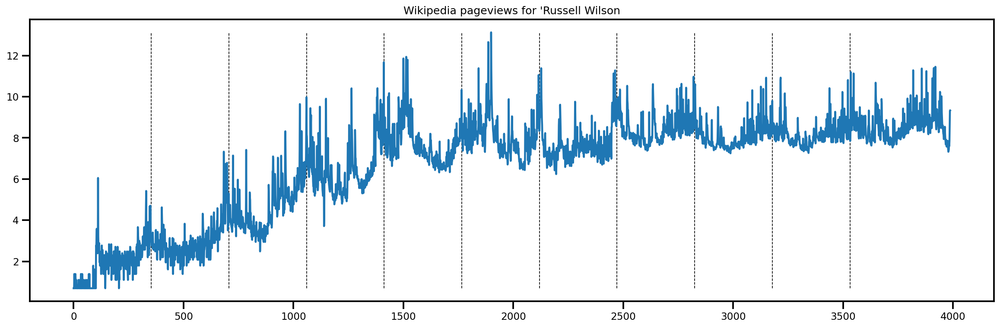

In [663]:
t = df['t'].ravel()
ys = df['y'].ravel()
n_changepoints = 10
changepoint_range = 0.8
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

fig, axes = plt.subplots(1, figsize=(20, 6))
axes.plot(ys)
axes.vlines(s, min(ys), max(ys), lw=0.8, linestyles='--')
axes.set_title(label="Wikipedia pageviews for 'Russell Wilson")
plt.show()

In [664]:
def trend(k, delta, s, t, m, A):
    #pdb.set_trace()
    # if batch shape is empty, delta has shape (n_changepoints, ) else (n_samples, n_changepoints)  
    gamma =  tf.convert_to_tensor(-s * delta, dtype=tf.float32)
    if len(gamma.shape) < 2:
        g = (k + tf.linalg.matmul(delta[tf.newaxis, ...], A, adjoint_b=True)) * t + (m +tf.linalg.matmul(gamma[tf.newaxis, ...], A, adjoint_b=True))
    else :
        g = (k[..., tf.newaxis] + tf.linalg.matmul(delta, A, adjoint_b=True)) * t + (m[..., tf.newaxis] +tf.linalg.matmul(gamma, A, adjoint_b=True))
    return tf.squeeze(g)

def fourier_series(t, p=7, n=3):
    # 2 pi n / p
    x = 2 * np.pi * np.arange(1, n + 1) / p
    # 2 pi n / p * t
    x = x * t[:, None]
    x = np.concatenate((np.cos(x), np.sin(x)), axis=1)
    return x

def fourier(t, p, n, beta):
    fourier = tf.convert_to_tensor(fourier_series(t, p=p, n=n), dtype=tf.float32)
    if len(beta.shape) < 2:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta[tf.newaxis, ...], fourier, adjoint_b=True)
    else:
        #pdb.set_trace()
        seasonal = tf.linalg.matmul(beta, fourier, adjoint_b=True)
        
    return tf.squeeze(seasonal)

In [224]:
def variance(sigma, n):
    if tf.size(sigma) >= 2:
        return tf.squeeze(sigma[..., tf.newaxis]*tf.eye(n)[tf.newaxis, ...])
        #return tf.linalg.LinearOperatorLowerTriangular(tf.squeeze(tf.eye(n)[..., tf.newaxis]*sigma[tf.newaxis, ...]))
    else:
        return sigma*tf.eye(n)
        #return tf.linalg.LinearOperatorLowerTriangular(tf.eye(n)*sigma)

In [523]:
df = tf.convert_to_tensor(3.)


In [532]:
df = tfd.Uniform(1., 100.).sample(1) # shape = (3, ) 
loc = tf.convert_to_tensor([1., 99., 4.]) # shape = (3, )
scale = tfd.HalfCauchy(loc=0, scale=5.).sample(3) # shape = (3, )
st = tfp.distributions.StudentT(
    df=df,
    loc=loc,
    scale=scale
)
st.sample() # shape = (3, )

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([ 6.231949 , 99.486404 , -0.4840846], dtype=float32)>

In [599]:
df = tfd.Uniform(1., 100.).sample() # shape = (1, ) 
print(df.shape)
loc = tf.convert_to_tensor([[1., 2., 3., 5], [1., 2., 3., 5]]) # shape = (1, )
print(loc.shape)
scale = tfd.HalfCauchy(loc=tf.zeros((2, 1)), scale=5.).sample() # shape = (4, )
print(scale.shape)


()
(2, 4)
(2, 1)


In [656]:
joint = tfd.JointDistributionSequential([
    # delta
    tfd.Sample(
        tfd.Laplace(loc=0., scale=5.), 
        4
    ), # shape = (n_samples, 4)
    # sigma
    tfd.HalfCauchy(loc=0., scale=5.), # shape = (n_samples, )
    # df
    tfd.Uniform(1, 100), # shape = (n_samples, )
    # y
    lambda df, sigma, delta: tfd.StudentT(
        df=df[..., tf.newaxis], # shape = (n_samples, 1)
        loc=tf.matmul(delta, tf.ones((4, 7))), # shape = (n_samples, 7)
        scale=sigma[..., tf.newaxis]) # y # # shape = (n_samples, 1)
])

In [657]:
joint.sample(8)

[<tf.Tensor: shape=(8, 4), dtype=float32, numpy=
 array([[ -2.277258  ,   4.1904564 ,  10.009862  ,   9.9872055 ],
        [ -2.0149484 ,   4.2162585 ,   7.3303037 ,   6.474126  ],
        [ -0.57894456,   0.59268034,   0.06249972, -14.536637  ],
        [  3.9501662 ,  -5.029067  ,   0.7756596 ,  -2.219403  ],
        [ -4.975043  ,  -2.4350493 ,   2.5659034 ,   7.513058  ],
        [ -5.475177  ,   2.1884093 ,  -0.07055205,  -5.0500817 ],
        [  3.8246393 , -12.244868  ,   8.136866  ,  -1.295289  ],
        [ 10.964262  , -21.514553  ,   1.2836771 ,   0.26742572]],
       dtype=float32)>,
 <tf.Tensor: shape=(8,), dtype=float32, numpy=
 array([52.47263  ,  6.862345 , 19.438322 , 29.700577 ,  5.9036803,
         8.944832 ,  0.9337046,  7.97704  ], dtype=float32)>,
 <tf.Tensor: shape=(8,), dtype=float32, numpy=
 array([50.45573  , 74.43195  , 91.03011  , 21.14235  , 38.411594 ,
        52.337128 , 11.248212 ,  1.9159551], dtype=float32)>,
 <tf.Tensor: shape=(8, 7), dtype=float32, nu

In [659]:
st = tfp.distributions.StudentT(
    df=df,
    loc=loc,
    scale=scale
)

In [781]:
class rw_model():
    """
    Parameters
        t: time points of observations
        n_changepoints: number of changepoints
        changepoint_range: range in which changepoints are allowed
    """
    
    def __init__(self, t, n_year, n_week, p_week, p_year, n_changepoints=None, changepoint_range = 0.8, s=None):
        
        #if n_changepoints is None:
        #    self._n_changepoints=np.floor(len(t)/p)
        if s is None:
            self._n_changepoints = n_changepoints
            self._s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
        else:
            self._n_changepoints = s.shape[0]
            self._s = s
        #pdb.set_trace()
        self._A = tf.convert_to_tensor((t[:, None] > self._s) * 1, dtype=tf.float32)
        self._t = t
        self._n_year = n_year
        self._n_week = n_week
        self._p_week = p_week
        self._p_year = p_year
        self._changepoint_range = changepoint_range
        self._N = t.shape[0]
        
        # if isinstance(n, list):
        #    n_distributions = [tfd.Sample(tfd.Normal(loc=0., scale=1.), 2*x) for x in n]
        
        
        self._joint = tfd.JointDistributionSequential([
            # k
            tfd.Normal(loc=0., scale=2.), # shape = n_samples
             # m
            tfd.Normal(loc=0., scale=2.), # shape = n_samples
            # tau
            tfd.Exponential(rate=10), # shape = n_samples
            # delta
            lambda tau: tfd.Sample(
                tfd.Laplace(loc=0., scale=tau), 
                self._n_changepoints
            ), # shape = n_samples x self._n_changepoints
            # beta_week
            #tfd.Sample(
            #    tfd.Normal(loc=0., scale=10.), 
            #    sample_shape=2*n_week
            #), # shape = n_samples x 2*n_week
            # beta_year
            tfd.Sample(
                tfd.Normal(loc=0., scale=10.), 
                sample_shape=2*n_year
            ), # shape = n_samples x 2*n_year
            # sigma
            tfd.HalfCauchy(loc=0., scale=5.), # shape = n_samples 
            # lambda sigma, beta_year, beta_week, delta, tau, m, k: tfd.MultivariateNormalDiag(
            #    loc=trend(k, delta, self._s, t, m, self._A) + fourier(t, p_week, n_week, beta_week) + fourier(self._t, p_year, n_year, beta_year),
            #    scale_identity_multiplier=sigma), # y
            # df
            tfd.Uniform(1, 100), # shape = n_samples x 
            # y
            lambda df, sigma, beta_year, delta, tau, m, k: tfd.Independent( #beta_week, 
                tfd.StudentT(
                    df=df[..., tf.newaxis], 
                    loc=trend(k, delta, self._s, t, m, self._A) + fourier(self._t, p_year, n_year, beta_year),
                    scale=sigma[..., tf.newaxis]), # y
                1
            )
        ])
    
    def sample(self, n_samples=None):
        if n_samples is None:
            return self._joint.sample()
        else:
            return self._joint.sample(n_samples)
       
    def joint_log_prob(self, k, m, tau, delta, beta_year, sigma, df,  y):
        return self._joint.log_prob(k, m, tau, delta, beta_year, sigma, df, y)
    
    def forecast():
        pass
    

In [782]:
t = df['t'].ravel()
ys = df['y'].ravel()
n_changepoints = 10
changepoint_range = 0.8
n_week = 3
p_week = 7
n_year = 10
p_year = 365.25
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]

seas_model = rw_model(
    t=t,
    n_week=n_week,
    p_week=p_week,
    n_year=n_year,
    p_year=p_year,
    n_changepoints=n_changepoints,
)

In [783]:
seas_model._joint.sample()

[<tf.Tensor: shape=(), dtype=float32, numpy=1.0393482>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-2.0071638>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.019521855>,
 <tf.Tensor: shape=(10,), dtype=float32, numpy=
 array([-0.01497206,  0.00290597, -0.01151654,  0.00851618, -0.06889381,
         0.0041871 , -0.04807755,  0.01461037, -0.02834758, -0.00703905],
       dtype=float32)>,
 <tf.Tensor: shape=(20,), dtype=float32, numpy=
 array([  9.613318 ,  -4.7575665,   5.7356453, -29.673874 ,   8.91912  ,
         27.900743 ,   1.531989 ,  -6.2550254,  -8.801888 ,   3.924427 ,
         -2.151413 , -18.150703 ,  -9.993784 ,  -5.9848385,   7.529485 ,
          5.644948 ,  -6.401906 ,  -4.5551357,  10.602894 ,  15.966934 ],
       dtype=float32)>,
 <tf.Tensor: shape=(), dtype=float32, numpy=14.977076>,
 <tf.Tensor: shape=(), dtype=float32, numpy=99.49832>,
 <tf.Tensor: shape=(3988,), dtype=float32, numpy=
 array([ 1.4377618e+00, -4.3559090e+01, -1.8400335e-01, ...,
         4.1989507e+03,

In [784]:
seas_model._joint.log_prob_parts(seas_model._joint.sample())

[<tf.Tensor: shape=(), dtype=float32, numpy=-1.6213297>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-3.0090718>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.128752>,
 <tf.Tensor: shape=(), dtype=float32, numpy=4.2620783>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-71.056694>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-3.3755093>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-4.59512>,
 <tf.Tensor: shape=(), dtype=float32, numpy=-14153.601>]

In [785]:
seas_model._joint.log_prob(seas_model._joint.sample())

<tf.Tensor: shape=(), dtype=float32, numpy=-12333.333>

In [786]:
seas_model.joint_log_prob(*seas_model.sample())

<tf.Tensor: shape=(), dtype=float32, numpy=-14801.715>

In [787]:
def unnormalized_posterior(k, m, tau, delta, beta_year, sigma, df):
    return seas_model.joint_log_prob(k, m, tau, delta, beta_year, sigma, df, ys)

In [788]:
unnormalized_posterior(*seas_model.sample()[:-1])

<tf.Tensor: shape=(), dtype=float32, numpy=-71232.77>

In [789]:
def trace_fn(_, pkr):
      return (
          pkr.inner_results.log_accept_ratio,
          pkr.inner_results.accepted_results.target_log_prob,
          pkr.inner_results.accepted_results.step_size)

In [ ]:
#inner_kernel = tfp.mcmc.RandomWalkMetropolis(
#    target_log_prob_fn=unnormalized_posterior,
#    new_state_fn=tfp.mcmc.random_walk_normal_fn(scale=0.1, name=None)
#)

In [ ]:
#inner_kernel = tfp.mcmc.HamiltonianMonteCarlo(
#    target_log_prob_fn=unnormalized_posterior,
#    step_size=np.float64(.1),
#    num_leapfrog_steps=8
#)


In [ ]:
#tfp.mcmc.NoUTurnSampler()

In [790]:
nuts_kernel = tfp.mcmc.NoUTurnSampler(
    target_log_prob_fn=unnormalized_posterior,
    step_size=np.float64(.01),
    max_tree_depth=10,
    max_energy_diff=1000.0,
    unrolled_leapfrog_steps=4,
    parallel_iterations=10
)

In [791]:
a, b = tf.constant(1., dtype=tf.float32), tf.constant(100., dtype=tf.float32),
tfp_interval = tfb.Inline(
    inverse_fn=( # from constraint space to unconstraint
        lambda x: tf.math.log(x - a) - tf.math.log(b - x)),
    forward_fn=(
        lambda y: (b - a) * tf.sigmoid(y) + a),
    forward_log_det_jacobian_fn=(
        lambda x: tf.math.log(b - a) - 2 * tf.nn.softplus(-x) - x),
    forward_min_event_ndims=0,
    name="interval")


In [792]:
trans_kernel = tfp.mcmc.TransformedTransitionKernel(
    inner_kernel=nuts_kernel,
    bijector=[
        tfp.bijectors.Identity(),    # k
        tfp.bijectors.Identity(),    # m
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # tau    # sample from real numbers and transforme to the positive real numbers (support of Exp-Distribution)
        tfp.bijectors.Identity(), # delta
        #tfp.bijectors.Identity(), # beta_week
        tfp.bijectors.Identity(), # beta_year
        tfp.bijectors.Invert(tfp.bijectors.Softplus()), # sigma  # sample from real numbers and transforme to the positive real numbers (support of Half-Cauchy-Distribution)
        tfp_interval, # df
    ]
) 

In [796]:
#kernel = tfp.mcmc.SimpleStepSizeAdaptation(
#    inner_kernel = trans_nuts,
#    num_adaptation_steps=15000,
#    target_accept_prob=0.6,
#    adaptation_rate=0.01
#)

adaptive_trans_kernel = tfp.mcmc.DualAveragingStepSizeAdaptation(
    inner_kernel=trans_kernel,
    num_adaptation_steps=2500,
    target_accept_prob=0.55,
    step_size_setter_fn=lambda pkr, new_step_size: pkr._replace(
        inner_results=pkr.inner_results._replace(step_size=new_step_size)
        ),
    step_size_getter_fn=lambda pkr: pkr.inner_results.step_size,
    log_accept_prob_getter_fn=lambda pkr: pkr.inner_results.log_accept_ratio,
)

#adaptive_trans_nuts = tfp.mcmc.DualAveragingStepSizeAdaptation(
#    inner_kernel=trans_nuts,
#    num_adaptation_steps=80,
#    target_accept_prob=0.55,
#    step_size_setter_fn=lambda pkr, new_step_size: pkr._replace(
#        inner_results=pkr.inner_results._replace(step_size=new_step_size)
#        ),
#    step_size_getter_fn=lambda pkr: pkr.inner_results.step_size,
#    log_accept_prob_getter_fn=lambda pkr: pkr.inner_results.log_accept_ratio,
#)

In [797]:
@tf.function(autograph=False, experimental_compile=True)
def run_chain_nuts(initial_state, num_results=10000, num_burnin_steps=2500):

    chains, kr = tfp.mcmc.sample_chain(
        kernel=adaptive_trans_kernel,
        num_results=num_results,
        num_burnin_steps=num_burnin_steps,
        current_state=initial_state,
        
        # trace_fn=trace_fn
    ) 
    #return chains, log_accept_ratio, target_log_prob, step_size
    return chains, kr

In [798]:
# MCMC params
num_results = 5000
num_burnin = 2500
num_chains = 4

# model params
n_changepoints = 10 
n_week=3
n_year=10


initial_state = [np.zeros(num_chains, dtype=np.float32), # k
                ys[0] * np.ones(num_chains, dtype=np.float32), # m
                 np.ones(num_chains, dtype=np.float32), # tau
                 np.zeros((num_chains, n_changepoints), dtype=np.float32), # delta
                 # np.zeros((num_chains, 2*n_week), dtype=np.float32), # beta_week
                 np.zeros((num_chains, 2*n_year), dtype=np.float32), # beta_year
                 np.ones(num_chains, dtype=np.float32), # sigma
                 30*np.ones(num_chains, dtype=np.float32) # df
                ]

In [799]:
# chains, log_accept_ratio, target_log_prob, step_size = run_chain_hmc(initial_state, num_results, num_burnin)
start = time.time()
chains, kr = run_chain_nuts(initial_state, num_results, num_burnin)
end = time.time()
print(f"{(end - start) / 10000} seconds per draw")

/usr/local/lib/python3.6/dist-packages/tensorflow_probability/python/mcmc/sample.py:333: UserWarning: Tracing all kernel results by default is deprecated. Set the `trace_fn` argument to None (the future default value) or an explicit callback that traces the values you are interested in.
  warnings.warn("Tracing all kernel results by default is deprecated. Set "


1.9369752140283585 seconds per draw


In [807]:
#chains_total = chains

In [757]:
chains = [chain[500:,] for chain in chains] 

In [804]:
#true_values = [k, m, tau, delta, beta_week, beta_year, sigma]
param_names = ['k', 'm', 'tau', 'delta', 'beta_year', 'sigma', 'df']

In [805]:
r_hat = tfp.mcmc.potential_scale_reduction(chains)
print("Acceptance rate:", kr.inner_results.inner_results.is_accepted.numpy().mean())
for i in range(len(chains)):
    print(f"R-hat diagnostic ({param_names[i]}):", r_hat[i].numpy())


Acceptance rate: 1.0
R-hat diagnostic (k): 1.1198742
R-hat diagnostic (m): 1.1256943
R-hat diagnostic (tau): 1.0015273
R-hat diagnostic (delta): [1.1063457 1.0048077 1.0002307 1.0007657 1.0047092 1.0042226 1.0031624
 1.003504  1.0022348 1.0011264]
R-hat diagnostic (beta_year): [1.0281808 1.000439  1.003594  1.0081888 1.0036364 1.0029186 1.0022153
 1.0080011 1.0084897 1.0006312 1.0058761 1.0036824 1.0029559 1.0010654
 1.0064093 1.0040401 1.0032736 1.0031962 1.0073695 1.0100698]
R-hat diagnostic (sigma): 1.1439795
R-hat diagnostic (df): 1.3251468


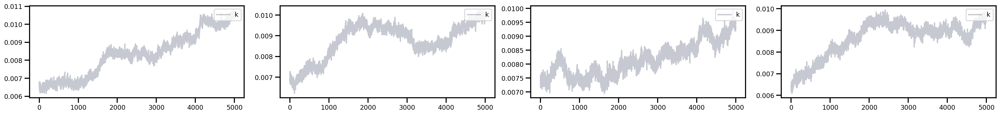

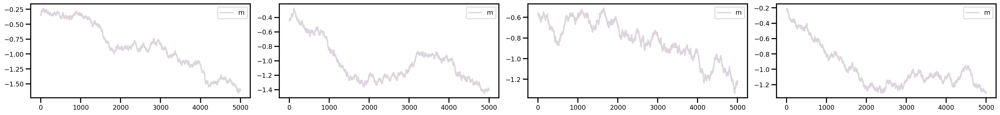

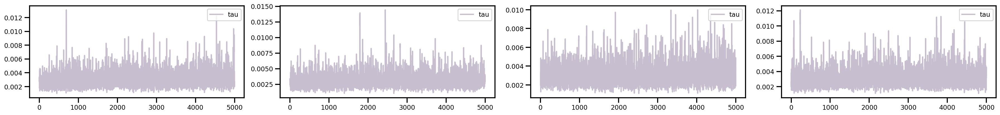

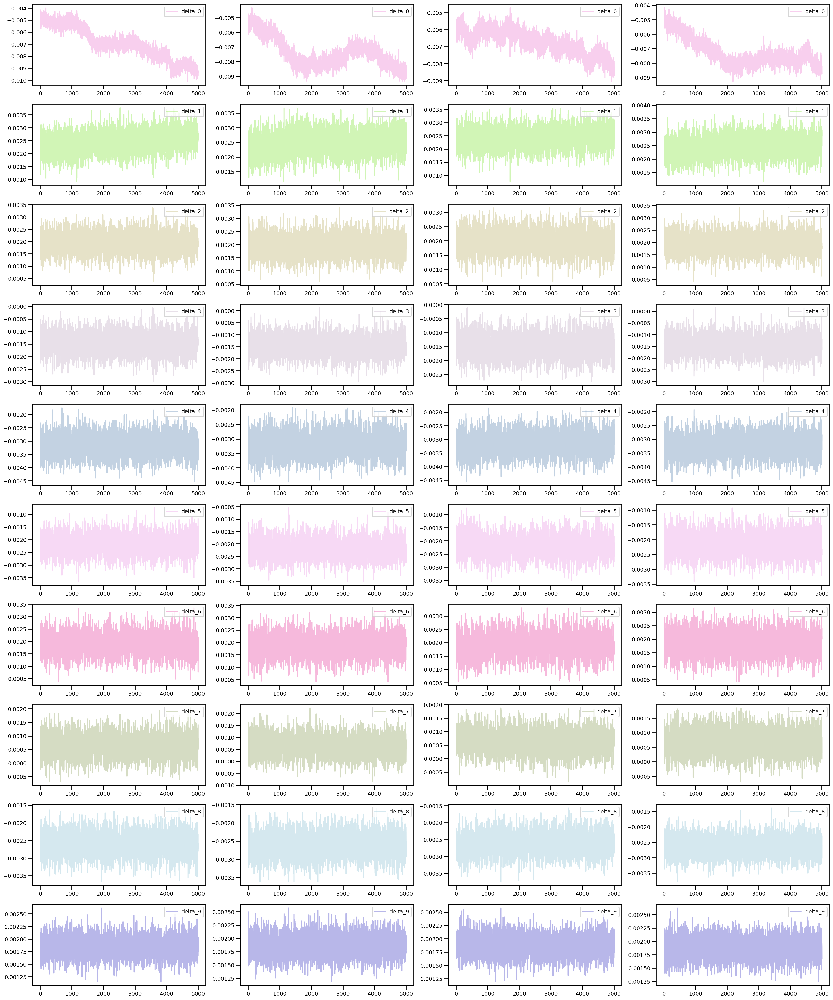

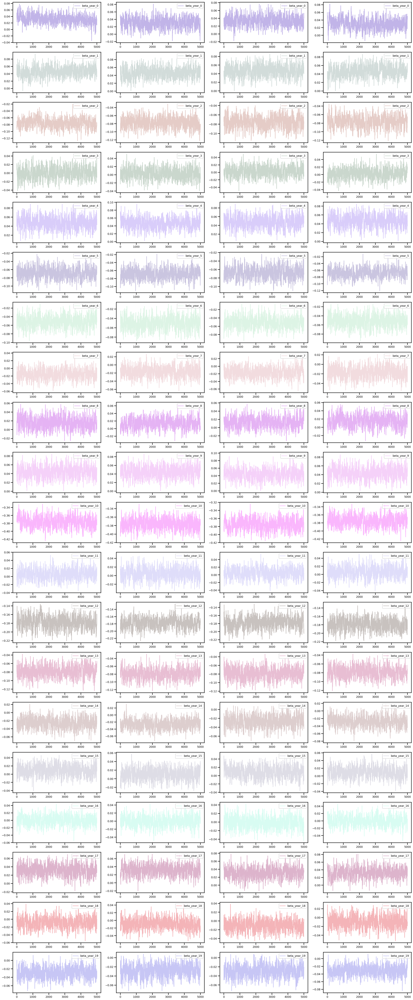

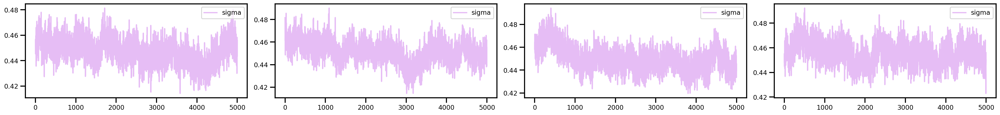

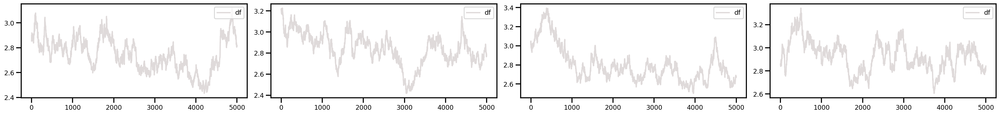

In [806]:
trace_plot(chains, param_names)

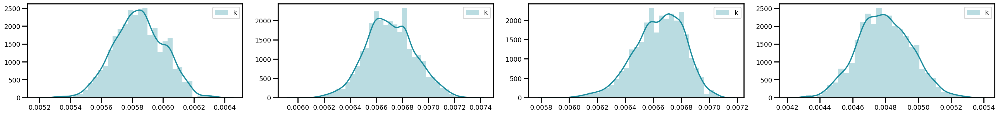

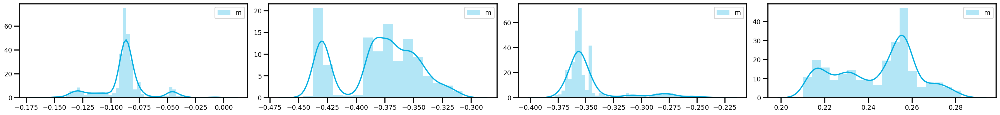

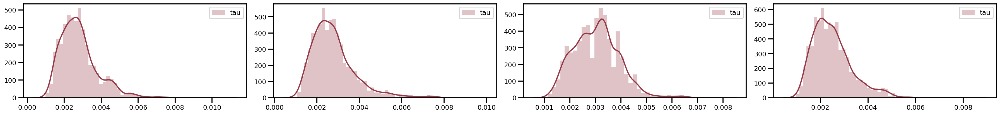

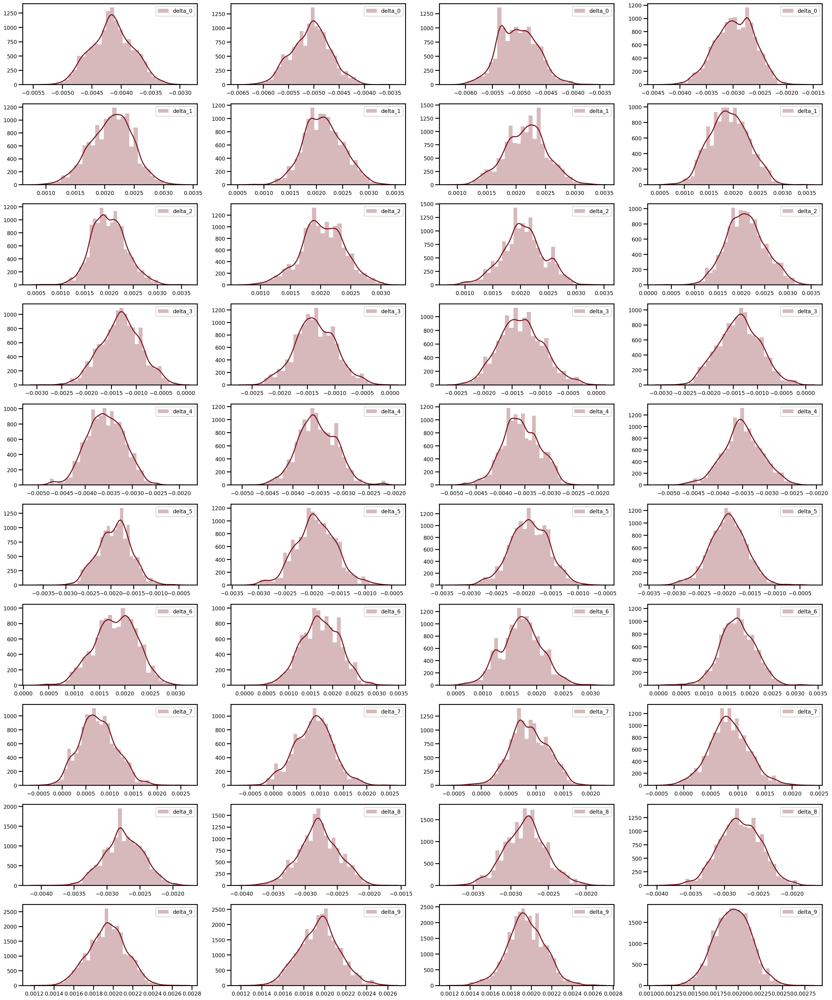

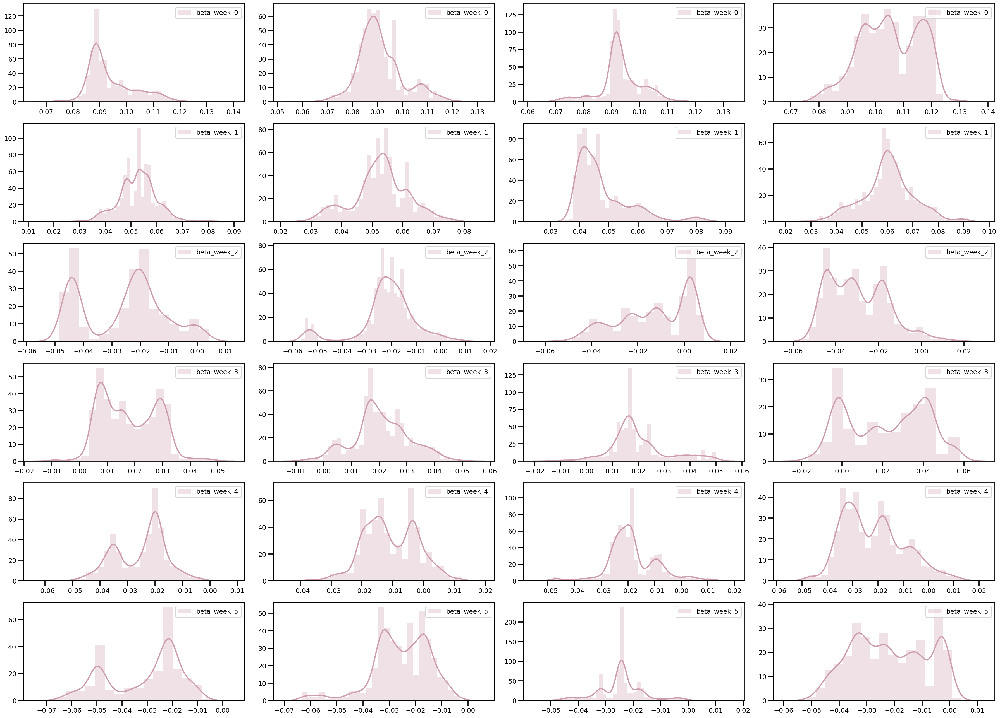

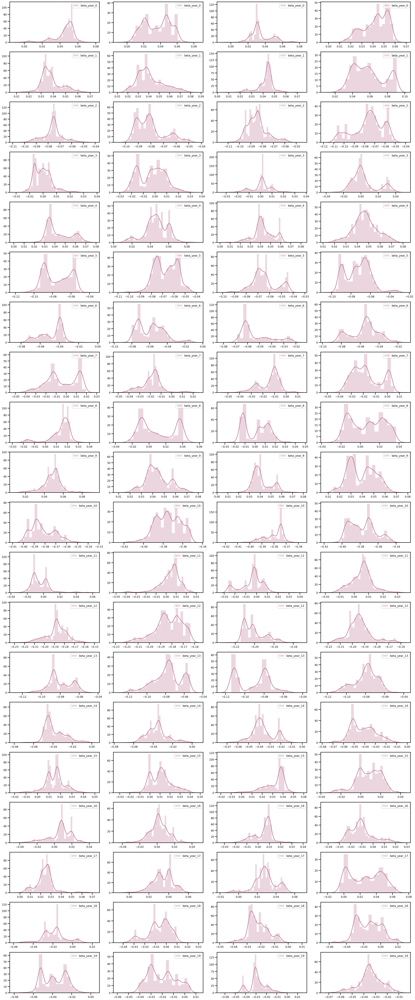

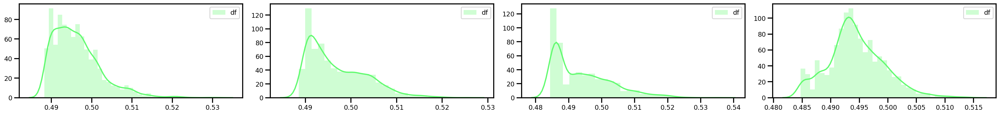

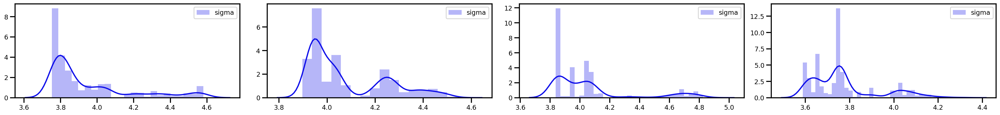

In [768]:
density_plot(chains, param_names)

In [808]:
k_chains, m_chains, tau_chains, delta_chains, beta_year_chains, sigma_chains, df_chains = chains
posterior_mean = [tf.math.reduce_mean(chain, axis=0).numpy().mean(axis=0) for chain in chains]
posterior_q5 = [tfp.stats.percentile(tf.reduce_mean(chain, axis=1), q=5, axis=0).numpy() for chain in chains]
posterior_q95 = [tfp.stats.percentile(tf.reduce_mean(chain, axis=1), q=95, axis=0).numpy() for chain in chains]

In [810]:
k_post, m_post, tau_post, delta_post, beta_year_post, sigma_post, df_post= posterior_mean
k_q5, m_q5, tau_q5, delta_q5, beta_year_q5, sigma_q5 , df_q9= posterior_q5
k_q95, m_q95, tau_q95, delta_q95, beta_year_q95, sigma_q95, df_q95 = posterior_q95

#n_changepoints = 5
#changepoint_range = 0.8
#t = np.arange(ys.shape[0])
s = np.linspace(0, changepoint_range * np.max(t), n_changepoints + 1)[1:]
A = tf.convert_to_tensor((t[:, None] > s) * 1, dtype=tf.float32)


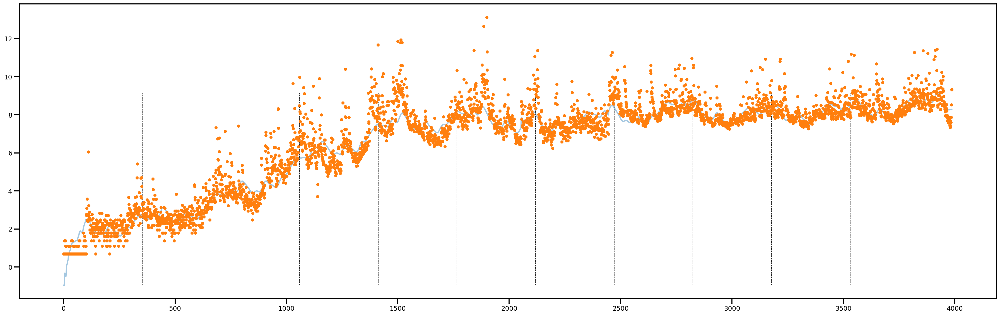

In [811]:
g = trend(k_post, delta_post, s, t, m_post, A)
yearly = fourier(t=t, p=365.25, n=10, beta=beta_year_post)
#weekly = fourier(t=t, p=7, n=3, beta=beta_week_post)
y_hat = g+yearly#+weekly

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(y_hat, alpha=0.4)
axes.plot(ys, '.')
axes.vlines(s, min(y_hat), max(y_hat), lw=0.8, linestyles='--')
plt.tight_layout()
plt.show()

In [812]:
tf.math.reduce_mean(tf.math.square(ys-y_hat))

<tf.Tensor: shape=(), dtype=float32, numpy=0.5483183>

In [813]:
tf.math.reduce_mean(tf.math.square(ys-g-yearly))

<tf.Tensor: shape=(), dtype=float32, numpy=0.54831827>

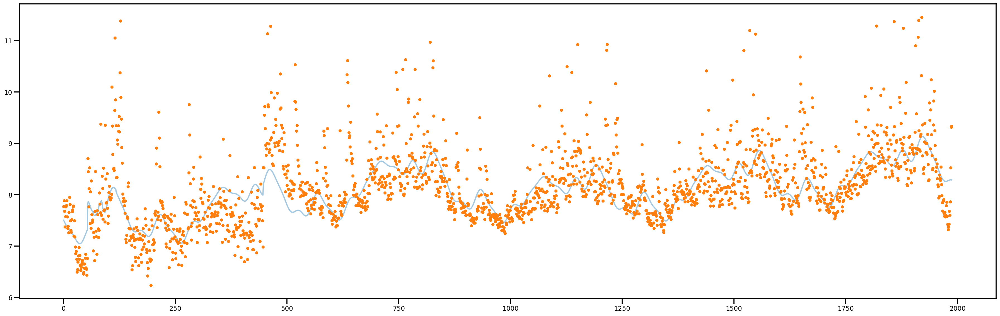

In [814]:
g = trend(k_post, delta_post, s, t, m_post, A)
yearly = fourier(t=t, p=365.25, n=10, beta=beta_year_post)
#weekly = fourier(t=t, p=7, n=3, beta=beta_week_post)
y_hat = g+yearly#+weekly

l = 2000
u = 4000
fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(y_hat[l:u], alpha=0.4)
axes.plot(ys[l:u], '.')
#axes.vlines(s, min(y_hat), max(y_hat), lw=0.8, linestyles='--')
plt.tight_layout()
plt.show()

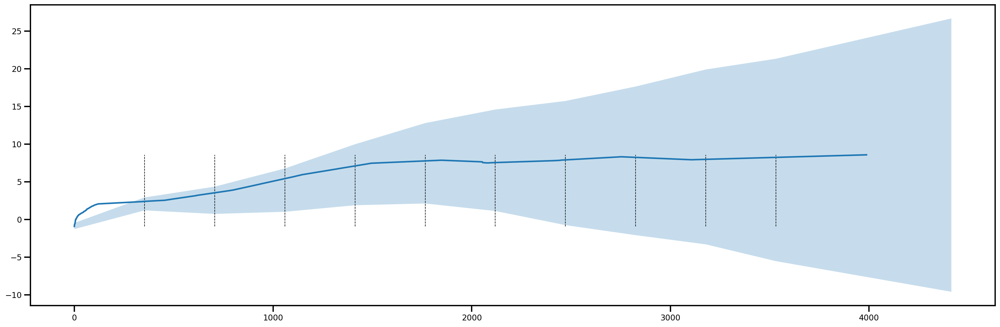

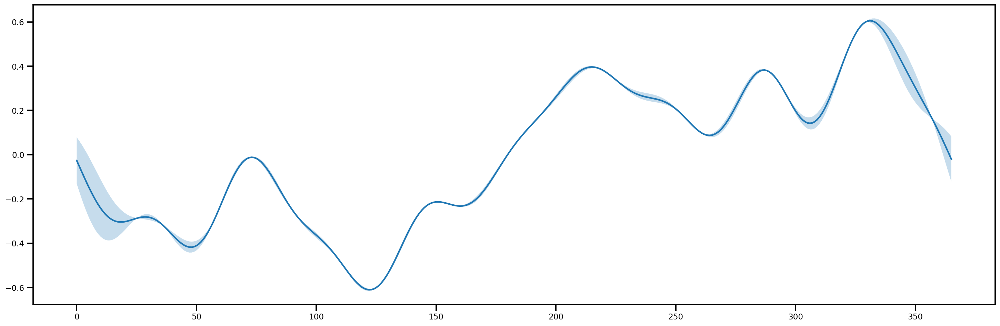

In [816]:
g = trend(k_post, delta_post, s, t, m_post, A)
g5 = trend(k_q5, delta_q5, s, t, m_q5, A)
g95 = trend(k_q95, delta_q95, s, t, m_q95, A)

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(g)
axes.vlines(s, min(g), max(g), lw=0.8, linestyles='--')
plt.fill_between(t, np.minimum(g5, g95), np.maximum(g5, g95), alpha=0.25)

t_year = np.arange(365.25)
yearly_mean = fourier(t=t_year, p=365.25, n=10, beta=beta_year_post)
yearly_q5 = fourier(t=t_year, p=365.25, n=10, beta=beta_year_q5)
yearly_q95 = fourier(t=t_year, p=365.25, n=10, beta=beta_year_q95)

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(yearly_mean)
plt.fill_between(t_year, np.minimum(yearly_q95, yearly_q5), np.maximum(yearly_q95, yearly_q5), alpha=0.25)



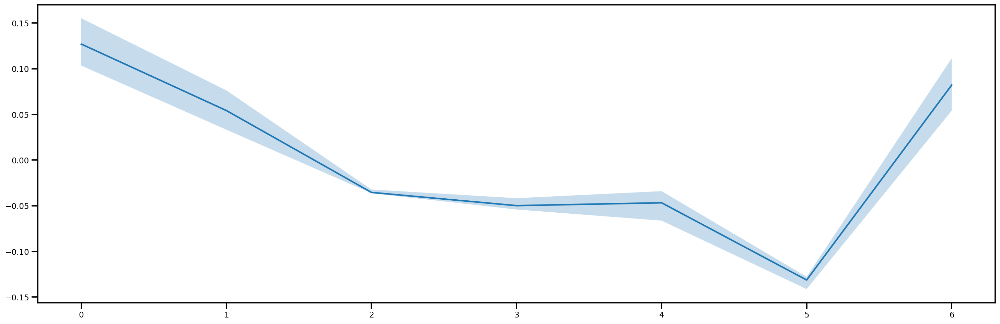

In [815]:
t_week = np.arange(7)
weekly_mean = fourier(t=t_week, p=7, n=3, beta=beta_week_post)
weekly_q5 = fourier(t=t_week, p=7, n=3, beta=beta_week_q5)
weekly_q95 = fourier(t=t_week, p=7, n=3, beta=beta_week_q95)

fig, axes = plt.subplots(1, figsize=(25, 8))
axes.plot(weekly_mean)
plt.fill_between(t_week, np.minimum(weekly_q95, weekly_q5), np.maximum(weekly_q95, weekly_q5), alpha=0.25)

## State Space Models